# Water balance tests

 - No Modflow
 - No Preferential flow
 - Water demand
 - Irrigation
 - No Allocation segments

# Hydrological modelling at hyper-resolution (< 1km): 

## Simulating human influences on the hydrological cycle

## Introduction

What influences on the water cycle become important to represent explicitly at higher resolutions?

The answer depends significantly on the environmental, economic, and sociopolitical context of the region of interest, as well as the resolution. Here, we present and showcase developments to the CWAtM hydrological mdoel to better simulate the hydrological cycle for a highly-managed basin at hyper-resolution (<1 km). 

The Upper Bhima basin in western India is a highly-managed basin of sufficient complexity. It hosts the rapidly growing cities of Pune and Solapur, a monsoonal climate, and an increasing competition for resources. It has significant agriculture irrigated with hundreds of reservoirs, canal networks delivering water up to a hundred kilmetres away, and significant groundwater abstraction. 

At hyper resolution, local water demand is necessarily satisfied and interacts with the water availability of other cells. The developments discussed herein relate to modeling the devliery of surface and groundwater to satisfy demands.

The Community Water Model (CWatM) is an open-source process-based hydrological model. A region is simulated as a connected grid of cells where the water fluxes within and between cells are calculated at a daily timestep. Cells in CWatM concerning surface water have a width of 0.0083 degrees (~850 m), and cells concerning groundwater have a width of 500 m.


## Settings

The following guidelines are to support setting up this Notebook for demonstrating CWatM outputs related to the FUSE project. However, please feel free to use this Notebook in anyway that it can be of benefit. 

### Guidelines

1. Designate a home folder containaing the CWatM input files related to the FUSE project, as well as the folder for CWatM outputs.

2. In the CWatM settings file, the following outputs are to be requested as daily maps. You may request more outputs, as long as the following are amongst them:

OUT_MAP_Daily = adminSegments, discharge, rainM3_segments, channelStorage_segments, prechannelStorage_segments, lakeResStorage_segments, prelakeResStorage_segments, totalSto_segments, pretotalSto_segments, storGroundwater_segments, prestorGroundwater_segments, totalET_segments, act_nonIrrConsumption_segments, EvapWaterBodyM_segments, EvapoChannel_segments, act_totalIrrConsumption_segments


In [1]:
home_folder = 'C:'
Modflow = True

fuse_folder_github = home_folder + '/GitHub/FUSE'
output_folder =  home_folder + '/CWatM_output'

In [2]:
from netCDF4 import Dataset, num2date
import matplotlib.pyplot as plt
import numpy as np
import plotly.graph_objects as go
from PIL import Image
import datetime

from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))




 are separated will be satisfied with water availability from upstream 
 
 the several processes that were previously to some degree absorbed into the lower resolution become necessary to simulate. 
 
  However, when reservoir storage and rivers allocated to satisfying this demand are located away from the demand itself, water . 
 
However, These include the , and groundwater dynamics. We present several developments to the open-source hydrological model CWatM developed at IIASA, showcased on a highly-managed basin  with sufficient complexity, namely the Upper Bhima basin in western India.

## CWatM: The Community Water Model
### An Open-source hydrological model developed at IIASA



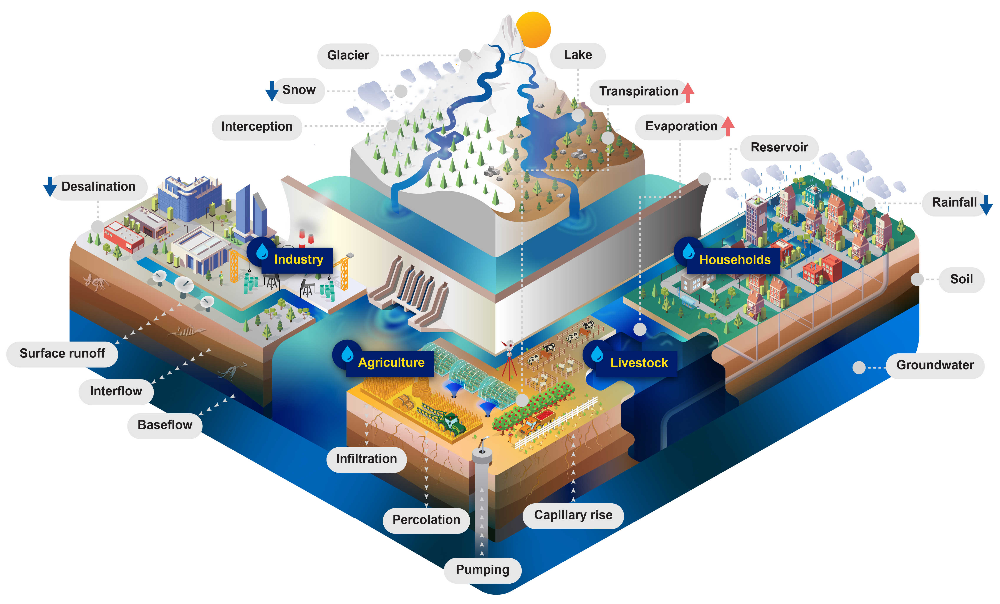

In [3]:
photo_folder = fuse_folder_github + '/Images'

img = Image.open(photo_folder + '/CWatM_schematic.jpg')
img




one must simulate the devlvery of water from reservoirs over their command area. delivering water between distant cells. water for cells to deliver water to cells not necessarily downstream . not necessarily touching to deliver water from one another to simulate the water used to satisfy local cell-specific human-related water demands is generally not restricted to the the locality itself. This is both because water is now delivered from upstream reservoirs located potentially several cells  away, and thatlocal groundwater pumping can affect grouundwater avaialbility and levels away from it..  delivered from local irrigation, industry, and domestic water demands can not longer be approrpiately assumed to be met from water within the local cell itself, as the cells themselves don't contain the reservoirs or canals from which the non-local water is deliveered. . This becomes increasingly less  although less so towards higher resolutions. Water delivery from reservoirs At hyper-resolution, water from

The Nira basin is a sub-basin of the the Upper Bhima basin in Western Peninsular India, itself the northwestern corrner of the Krisna basin, and relatively entirely within the State of Maharashtra. This basin is being presesnted as an example case study to showcase the model developments discussed herein.

CWatM is a hydrological model 




These developments are inspired in part by the FUSE project: https://fuse.stanford.edu/

The model development highlights inlclude:
1. Simuating water distribution/delivery from reservoirs to their command areas 
2. Simulating canal leakage, into the aquifer
3. Region-specific reservoir operations
 . Shutting off reservoir discharge downstream in certain periods
 . Individual Reservoir-specific operations
 . More annual variation, and allowing for emptying.
4. Groundwater pumping and levels
 . Local groundwater demand abstracted within cell 
4. Crop-specific water use and relative yields

To showcase the developments, we will focus on a sub-basin of the Upper Bhima basin with sufficient complexity The Nira sub-basin  contains:
 - 4 reservoirs: 
     - 3 releasing into the river downstream, and 
     - 1 releasing over a command area with canal leakge
 - many lakes
 - 16 eco-political regions 
 

This notebook presents the water balance for the Nira river sub-basin of the Upper Bhima basin.

These are the results of CWatM simulations:
 - https://cwatm.iiasa.ac.at/
 - https://github.com/CWatM/CWatM

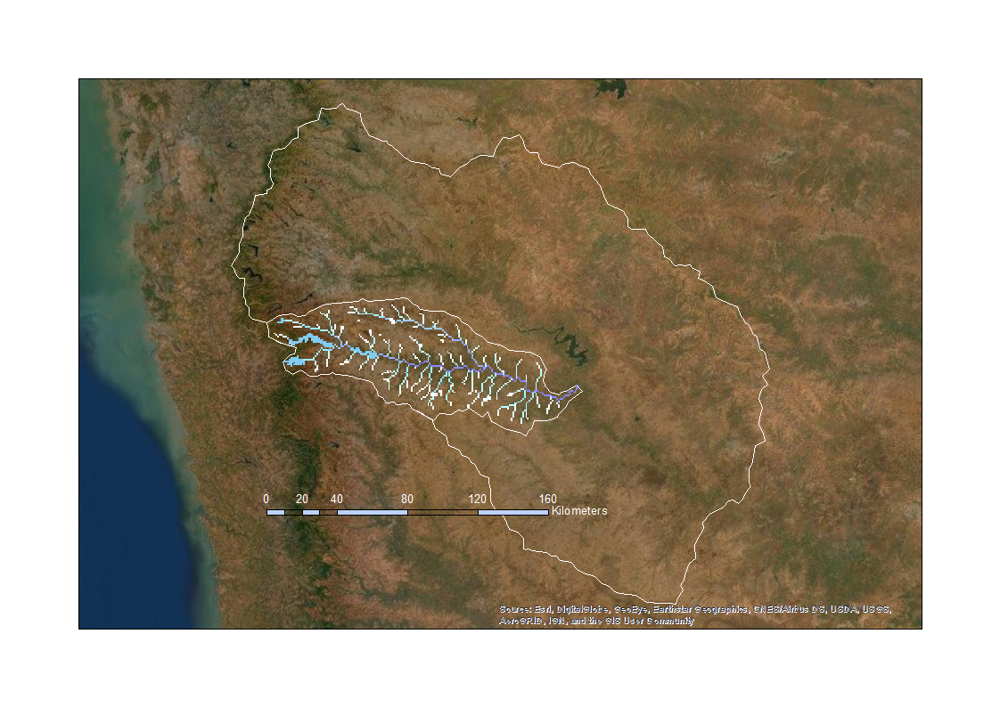

In [4]:
img = Image.open(photo_folder + '/Sarati_in_UB.tif')
img

Figure 1 The Nira river sub-basin: Rivers, Lakes, and Reservoirs and highlighted in shades of Blue and White. The sub-basin is ~160 km long. Noteworthy to those more familiar with the region is the Ujjani reservoir, discharging near the outlet of the Nira river sub-basin. 

 # Data
 
  The data contain reservoir operations for 3/4 reservoirs each for different periods of around 5 years, and contain river discharge points for 4 locations for different periods of between 10 and 30 years

In [5]:
nc_admin_segments = Dataset(output_folder + "/adminSegments_daily.nc", 'r')
admin_segments = nc_admin_segments.variables['adminSegments'][0,:,:]

Dates_simulation = num2date(nc_admin_segments.variables['time'][:], units=nc_admin_segments.variables['time'].units)

In [6]:
def commas(num):
    return '{:,.2f}'.format(num)

def geo_idx(dd, dd_array):
   """
     search for nearest decimal degree in an array of decimal degrees and return the index.
     np.argmin returns the indices of minium value along an axis.
     so subtract dd from all values in dd_array, take absolute value and find index of minium.
    """
   geo_idx = (np.abs(dd_array - dd)).argmin()
   return geo_idx

In [7]:
Segment_reps = [[1, 129, 127]]

## Nira sub-basin outflow

Here, we present the monthly discharge at the outlet of the Nira subbasin.

In [8]:
Discharge_locations = [('Nira outlet', 17.97, 75.12)]

nc_simulated = Dataset(output_folder + '/discharge_daily.nc', 'r')

FLOWS_simulated = []

lats = nc_simulated.variables['lat'][:]
lons = nc_simulated.variables['lon'][:]

for discharge_location in Discharge_locations:
    in_lat = discharge_location[1]
    in_lon = discharge_location[2]
    
    lat_idx = geo_idx(in_lat, lats)
    lon_idx = geo_idx(in_lon, lons)
    
    FLOWS_simulated.append(nc_simulated.variables['discharge'][:, lat_idx, lon_idx])
    

In [9]:
for i in range(len(Discharge_locations)):

    fig = go.Figure()

    fig.add_trace(go.Scatter(y=FLOWS_simulated[i],
                             x=Dates_simulation,
                    mode='lines',
                    name='Simulated'))


    fig.update_layout(title='Discharge: '+ Discharge_locations[i][0],
                           xaxis_title = 'Days',
                           yaxis_title = 'Discharge (m3/s)')

    fig.show()

In [10]:
if not Modflow:

    Vars = [['rainM3_segments', 'Rain', 'Volume (MCM)', 1_000_000., 'Input'],
            ['totalET_segments',  'Evapotranspiration', 'Volume (MCM)', 1_000_000., 'Output'],
            ['EvapoChannel_segments',  'Channel evaporation', 'Volume (MCM)', 1_000_000., 'Output'],
            ['EvapWaterBodyM_segments',  'Water bodies evaporation', 'Volume (MCM)', 1_000_000., 'Output'],
            ['act_nonIrrConsumption_segments',  'non Irrigation consumption', 'Volume (MCM)', 1_000_000., 'Output'],
            ['channelStorage_segments', 'Channel storage', 'Volume (MCM)', 1_000_000., 'Storage'],
            ['lakeResStorage_segments',  'Water bodies storage', 'Volume (MCM)', 1_000_000.,'Storage'],
            ['totalSto_segments',  'Soil storage', 'Volume (MCM)', 1_000_000.,'Storage'],
            ['storGroundwater_segments',  'Groundwater storage', 'Volume (MCM)', 1_000_000.,'Storage'], 
            ['sum_interceptStor_segments',  'Intercept storage', 'Volume (MCM)', 1_000_000.,'Storage'],
            ['act_totalIrrConsumption_segments',  'Irrigation consumption', 'Volume (MCM)', 1_000_000., 'Output_partition'],
            ['sum_actBareSoilEvap_segments',  'Bare soil evaporation', 'Volume (MCM)', 1_000_000., 'Output_partition'],
            ['sum_openWaterEvap_segments',  'Open water evaporation', 'Volume (MCM)', 1_000_000., 'Output_partition'],
            ['sum_interceptEvap_segments',  'Intercept evaporation', 'Volume (MCM)', 1_000_000., 'Output_partition'],
            ['sum_actTransTotal_segments',  'Transpiration', 'Volume (MCM)', 1_000_000., 'Output_partition'],
            ['sum_runoff_segments',  'Runoff', 'Volume (MCM)', 1_000_000., 'Output_partition'], 
            ['sum_gwRecharge_segments', 'Groundwater recharge', 'Volume (MCM)', 1_000_000., 'Output_partition'],
            ['GW_Pumping_segments',  'Groundwater pumping requested', 'Volume (MCM)', 1_000_000., 'Input_partition'],
            ['capillar_segments', 'Capillary rise', 'Volume (MCM)', 1_000_000., 'Input_partition'],
            ['baseflow_segments', 'Baseflow', 'Volume (MCM)', 1_000_000., 'Input_partition'],
            ['GW_Pumping_segments',  'Groundwater pumping requested', 'Volume (MCM)', 1_000_000., 'Output_GW'],
            ['capillar_segments', 'Capillary rise', 'Volume (MCM)', 1_000_000., 'Output_GW'],
            ['baseflow_segments', 'Baseflow', 'Volume (MCM)', 1_000_000., 'Output_GW'],
            ['sum_gwRecharge_segments', 'Groundwater recharge', 'Volume (MCM)', 1_000_000., 'Input_GW'],
            ['storGroundwater_segments',  'Groundwater storage', 'Volume (MCM)', 1_000_000.,'Storage_GW']]


if Modflow:
    
    Vars = [['rainM3_segments', 'Rain', 'Volume (MCM)', 1_000_000., 'Input'],
            ['totalET_segments',  'Evapotranspiration', 'Volume (MCM)', 1_000_000., 'Output'],
            ['EvapoChannel_segments',  'Channel evaporation', 'Volume (MCM)', 1_000_000., 'Output'],
            ['EvapWaterBodyM_segments',  'Water bodies evaporation', 'Volume (MCM)', 1_000_000., 'Output'],
            ['act_nonIrrConsumption_segments',  'non Irrigation consumption', 'Volume (MCM)', 1_000_000., 'Output'],
            ['channelStorage_segments', 'Channel storage', 'Volume (MCM)', 1_000_000., 'Storage'],
            ['lakeResStorage_segments',  'Water bodies storage', 'Volume (MCM)', 1_000_000.,'Storage'],
            ['totalSto_segments',  'Soil storage', 'Volume (MCM)', 1_000_000.,'Storage'],
            ['gwstore_segments',  'GW storage', 'Volume (MCM)', 1_000_000.,'Storage'],
            ['act_totalIrrConsumption_segments',  'Irrigation consumption', 'Volume (MCM)', 1_000_000., 'Output_partition'],
            ['sum_actBareSoilEvap_segments',  'Bare soil evaporation', 'Volume (MCM)', 1_000_000., 'Output_partition'],
            ['sum_openWaterEvap_segments',  'Open water evaporation', 'Volume (MCM)', 1_000_000., 'Output_partition'],
            ['sum_interceptEvap_segments',  'Intercept evaporation', 'Volume (MCM)', 1_000_000., 'Output_partition'],
            ['sum_actTransTotal_segments',  'Transpiration', 'Volume (MCM)', 1_000_000., 'Output_partition'],
            ['sum_runoff_segments',  'Runoff', 'Volume (MCM)', 1_000_000., 'Output_partition'], 
            ['sum_gwRecharge_segments', 'GW recharge', 'Volume (MCM)', 1_000_000., 'Output_partition'],
            ['act_LocalLakeAbstract_segments', 'Local water body abstractions', 'Volume (MCM)', 1_000_000., 'Output_partition'],  #This is included in act_bigLakeAbstract
            ['EvapWaterBodyM_segments',  'Water bodies evaporation', 'Volume (MCM)', 1_000_000., 'Output_LR'],
            ['act_bigLakeResAbst_segments', 'WB effective abstraction', 'Volume (MCM)', 1_000_000., 'Output_LR'],
            ['leakageC_daily_segments',  'WB canal leakage', 'Volume (MCM)', 1_000_000., 'Output_LR'],
            ['lakeResOutflowM_segments',  'Lake and Reservoir outflow', 'Volume (MCM)', 1_000_000., 'Output_LR'],

            ['lakeResStorage_segments',  'Water bodies storage', 'Volume (MCM)', 1_000_000.,'Storage_LR'],
            ['lakeResInflowM_segments', 'Lake and Reservoir inflow', 'Volume (MCM)', 1_000_000., 'Input_LR'],
            ['capillar_segments', 'Capillary rise', 'Volume (MCM)', 1_000_000., 'Input_partition'],
            ['baseflow_segments', 'Baseflow', 'Volume (MCM)', 1_000_000., 'Input_partition'],
            ['act_nonIrrConsumption_segments',  'nonIrr consumption', 'Volume (MCM)', 1_000_000., 'Output_Consumption'],
            ['act_totalIrrConsumption_segments',  'Irr consumption', 'Volume (MCM)', 1_000_000., 'Output_Consumption'],
            ['addtoevapotrans_segments',  'Evap loss from withdrawals', 'Volume (MCM)', 1_000_000., 'Output_Consumption'],
            ['returnFlow_segments',  'Return flow from withdrawals', 'Volume (MCM)', 1_000_000., 'Output_Consumption'],
            ['GW_Pumping_segments',  'GW requested', 'Volume (MCM)', 1_000_000., 'Input_Consumption'],
            ['act_SurfaceWaterAbstract_segments', 'SW abstractions', 'Volume (MCM)', 1_000_000., 'Input_Consumption'],
            ['GW_Pumping_segments',  'GW pumping requested', 'Volume (MCM)', 1_000_000., 'Output_GW'],
            ['ActualPumpingRate_segments',  'GW pumping actual', 'Volume (MCM)', 1_000_000., 'Output_GW'],
            ['capillar_segments', 'Capillary rise', 'Volume (MCM)', 1_000_000., 'Output_GW'],
            ['baseflow_segments', 'Baseflow', 'Volume (MCM)', 1_000_000., 'Output_GW'],
            ['sum_gwRecharge_segments', 'GW recharge', 'Volume (MCM)', 1_000_000., 'Input_GW'],#Now split up into perc3toGW and prefFlow
            ['sum_prefFlow_segments', 'Preferential flow', 'Volume (MCM)', 1_000_000., 'Input_partition'],
            ['sum_perc3toGW_segments', 'Percolation to GW', 'Volume (MCM)', 1_000_000., 'Input_partition'],
            ['gwstore_segments',  'GW storage', 'Volume (MCM)', 1_000_000.,'Storage_GW']]
    
#['act_LocalLakeAbstract_segments', 'Local water body abstractions', 'Volume (MCM)', 1_000_000., 'Output_LR'],
#['EvapWaterBodyM_segments',  'Water bodies evaporation', 'Volume (MCM)', 1_000_000., 'Output_LR'],
#['act_bigLakeResAbst_segments', 'Lake and Reservoir abstractions (Command area)', 'Volume (MCM)', 1_000_000., 'Output_LR'],
#['lakeResInflowM_segments', 'Lake and Reservoir inflow', 'Volume (MCM)', 1_000_000., 'Input_LR'],
#['lakeResOutflowM_segments',  'Lake and Reservoir outflow', 'Volume (MCM)', 1_000_000., 'Output_LR'],

# ['sum_interceptStor_segments',  'Intercept storage', 'Volume (MCM)', 1_000_000.,'Storage'],

#['GWVolumeVariation_segments', 'Groundwater variation', 'Volume (MCM)', 1_000_000., 'Storage_GW']

"""
# Vars for CWatM without Modflow
Vars = [['rainM3_segments', 'Rain', 'Volume (MCM)', 1_000_000., 'Input'],
        ['totalET_segments',  'Evapotranspiration', 'Volume (MCM)', 1_000_000., 'Output'],
        ['EvapoChannel_segments',  'Channel evaporation', 'Volume (MCM)', 1_000_000., 'Output'],
        ['EvapWaterBodyM_segments',  'Water bodies evaporation', 'Volume (MCM)', 1_000_000., 'Output'],
        ['act_nonIrrConsumption_segments',  'non Irrigation consumption', 'Volume (MCM)', 1_000_000., 'Output'],
        ['channelStorage_segments', 'Channel storage', 'Volume (MCM)', 1_000_000., 'Storage'],
        ['lakeResStorage_segments',  'Water bodies storage', 'Volume (MCM)', 1_000_000.,'Storage'],
        ['totalSto_segments',  'Soil storage', 'Volume (MCM)', 1_000_000.,'Storage'],
        ['storGroundwater_segments',  'Groundwater storage', 'Volume (MCM)', 1_000_000.,'Storage']]
"""

"""


['prechannelStorage_segments', 'pre Channel storage', 'Volume (MCM)', 1_000_000.], 
['prelakeResStorage_segments',  'pre Water bodies storage', 'Volume (MCM)', 1_000_000.],
['pretotalSto_segments',  'pre Soil storage', 'Volume (MCM)', 1_000_000.],
['prestorGroundwater_segments',  'pre Groundwater storage', 'Volume (MCM)', 1_000_000.],

['act_totalIrrConsumption_segments',  'Irrigation consumption', 'Volume (MCM)', 1_000_000.]]
"""     

"""
Vars = [['rainM3_segments', 'Rain', 'Volume (MCM)', 1_000_000., 'Input'],
        ['totalET_segments',  'Evapotranspiration', 'Volume (MCM)', 1_000_000., 'Output'],
        ['EvapoChannel_segments',  'Channel evaporation', 'Volume (MCM)', 1_000_000., 'Output'],
        ['EvapWaterBodyM_segments',  'Water bodies evaporation', 'Volume (MCM)', 1_000_000., 'Output'],
        ['act_nonIrrConsumption_segments',  'non Irrigation consumption', 'Volume (MCM)', 1_000_000., 'Output'],
        ['channelStorage_segments', 'Channel storage', 'Volume (MCM)', 1_000_000., 'Storage'],
        ['lakeResStorage_segments',  'Water bodies storage', 'Volume (MCM)', 1_000_000.,'Storage'],
        ['totalSto_segments',  'Soil storage', 'Volume (MCM)', 1_000_000.,'Storage'],
        ['gwstore_segments',  'Groundwater storage', 'Volume (MCM)', 1_000_000.,'Storage']]
"""

"""
# Vars for CWatM without Modflow
Vars = [['rainM3_segments', 'Rain', 'Volume (MCM)', 1_000_000., 'Input'],
        ['totalET_segments',  'Evapotranspiration', 'Volume (MCM)', 1_000_000., 'Output'],
        ['EvapoChannel_segments',  'Channel evaporation', 'Volume (MCM)', 1_000_000., 'Output'],
        ['EvapWaterBodyM_segments',  'Water bodies evaporation', 'Volume (MCM)', 1_000_000., 'Output'],
        ['act_nonIrrConsumption_segments',  'non Irrigation consumption', 'Volume (MCM)', 1_000_000., 'Output'],
        ['channelStorage_segments', 'Channel storage', 'Volume (MCM)', 1_000_000., 'Storage'],
        ['lakeResStorage_segments',  'Water bodies storage', 'Volume (MCM)', 1_000_000.,'Storage'],
        ['totalSto_segments',  'Soil storage', 'Volume (MCM)', 1_000_000.,'Storage'],
        ['storGroundwater_segments',  'Groundwater storage', 'Volume (MCM)', 1_000_000.,'Storage']]
"""

"""
['prechannelStorage_segments', 'pre Channel storage', 'Volume (MCM)', 1_000_000.], 
['prelakeResStorage_segments',  'pre Water bodies storage', 'Volume (MCM)', 1_000_000.],
['pretotalSto_segments',  'pre Soil storage', 'Volume (MCM)', 1_000_000.],
['prestorGroundwater_segments',  'pre Groundwater storage', 'Volume (MCM)', 1_000_000.],

['act_totalIrrConsumption_segments',  'Irrigation consumption', 'Volume (MCM)', 1_000_000.]]
"""

Input, Storage, Output = [], [], []
        
Input_partition, Output_partition = [], []
Input_GW, Storage_GW, Output_GW = [], [], []
Input_LR, Storage_LR, Output_LR = [], [], []
Input_Consumption, Output_Consumption = [], []

new_change_method = True

if new_change_method == False:

    for var in Vars:

        nc_filename = output_folder +'/'+ var[0] + '_daily.nc'

        if var[-1] == 'Input':
            Input.append([var, Dataset(output_folder +'/'+ var[0] + '_daily.nc', 'r').variables[var[0]]])

        elif var[-1] == 'Output':
            Output.append([var, Dataset(output_folder +'/'+ var[0] + '_daily.nc', 'r').variables[var[0]]])

        elif var[-1] == 'Storage':
            Storage.append([var, Dataset(output_folder +'/'+ var[0] + '_daily.nc', 'r').variables[var[0]], Dataset(output_folder +'/pre'+ var[0] + '_daily.nc', 'r').variables['pre'+var[0]]])

        elif var[-1] == 'Output_partition':
            Output_partition.append([var, Dataset(output_folder +'/'+ var[0] + '_daily.nc', 'r').variables[var[0]]])

        elif var[-1] == 'Input_partition':
            Input_partition.append([var, Dataset(output_folder +'/'+ var[0] + '_daily.nc', 'r').variables[var[0]]])

        elif var[-1] == 'Output_GW':
            Output_GW.append([var, Dataset(output_folder +'/'+ var[0] + '_daily.nc', 'r').variables[var[0]]])

        elif var[-1] == 'Input_GW':
            Input_GW.append([var, Dataset(output_folder +'/'+ var[0] + '_daily.nc', 'r').variables[var[0]]])

        elif var[-1] == 'Storage_GW':
            Storage_GW.append([var, Dataset(output_folder +'/'+ var[0] + '_daily.nc', 'r').variables[var[0]], Dataset(output_folder +'/pre'+ var[0] + '_daily.nc', 'r').variables['pre'+var[0]]])
else:
    for var in Vars:
    
        nc_filename = output_folder +'/'+ var[0] + '_daily.nc'

        if var[-1] == 'Input':
            Input.append([var, Dataset(output_folder +'/'+ var[0] + '_daily.nc', 'r').variables[var[0]]])

        elif var[-1] == 'Output':
            Output.append([var, Dataset(output_folder +'/'+ var[0] + '_daily.nc', 'r').variables[var[0]]])

        elif var[-1] == 'Storage':
            Storage.append([var, Dataset(output_folder +'/'+ var[0] + '_daily.nc', 'r').variables[var[0]]])

        elif var[-1] == 'Output_partition':
            Output_partition.append([var, Dataset(output_folder +'/'+ var[0] + '_daily.nc', 'r').variables[var[0]]])

        elif var[-1] == 'Input_partition':
            Input_partition.append([var, Dataset(output_folder +'/'+ var[0] + '_daily.nc', 'r').variables[var[0]]])

        elif var[-1] == 'Output_GW':
            Output_GW.append([var, Dataset(output_folder +'/'+ var[0] + '_daily.nc', 'r').variables[var[0]]])

        elif var[-1] == 'Input_GW':
            Input_GW.append([var, Dataset(output_folder +'/'+ var[0] + '_daily.nc', 'r').variables[var[0]]])

        elif var[-1] == 'Storage_GW':
            Storage_GW.append([var, Dataset(output_folder +'/'+ var[0] + '_daily.nc', 'r').variables[var[0]]])
            
        elif var[-1] == 'Output_LR':
            Output_LR.append([var, Dataset(output_folder +'/'+ var[0] + '_daily.nc', 'r').variables[var[0]]])

        elif var[-1] == 'Input_LR':
            Input_LR.append([var, Dataset(output_folder +'/'+ var[0] + '_daily.nc', 'r').variables[var[0]]])

        elif var[-1] == 'Storage_LR':
            Storage_LR.append([var, Dataset(output_folder +'/'+ var[0] + '_daily.nc', 'r').variables[var[0]]])
            
        elif var[-1] == 'Output_Consumption':
            Output_Consumption.append([var, Dataset(output_folder +'/'+ var[0] + '_daily.nc', 'r').variables[var[0]]])

        elif var[-1] == 'Input_Consumption':
            Input_Consumption.append([var, Dataset(output_folder +'/'+ var[0] + '_daily.nc', 'r').variables[var[0]]])

In [11]:
#rain_monAvg_representative= []

for seg in Segment_reps:   
    
    total_output, total_input, total_change = 0, 0 ,0
    
    fig_WB = go.Figure()
    
    X = Dates_simulation
    X = X[2:]
    
    fig_WB.update_layout(title = 'Water balance',
                      xaxis_title = 'Days',
                      yaxis_title = 'Volume (M3)',
                      barmode='relative')
    

    # Inputs
    for Var in Input:
        
        Y = Var[1][:,seg[1], seg[2]]
        Y = Y[2:]
        total_input += np.sum(Y)
        
        
        fig_WB.add_trace(go.Bar(y = Y,
                                x = X,
                                name = Var[0][1]))
        
        fig = go.Figure()
        fig.add_trace(go.Scatter(y = Y,
                                 x = X,
                                 mode='lines'))
        
        fig.update_layout(title = Var[0][1],
                          xaxis_title = 'Days',
                          yaxis_title = Var[0][2])

        fig.show()
        
       
        
    # Outputs
    
    #Dischrage from the basin
    
    Y = FLOWS_simulated[0] * 60*60*24
    Y = Y[2:]
    total_output += np.sum(Y)
    
    fig_WB.add_trace(go.Bar(y = -Y,
                            x = X,
                            name = Discharge_locations[0][0]))
    
    # Other outputs
    
    for Var in Output:

        Y = Var[1][:,seg[1], seg[2]]
        Y = Y[2:]
        total_output += np.sum(Y)
        
        fig_WB.add_trace(go.Bar(y = -Y,
                                x = X,
                                name = Var[0][1]))
        
        fig = go.Figure()
        fig.add_trace(go.Scatter(y = Y,
                                 x = X,
                                 mode='lines'))
        
        fig.update_layout(title = Var[0][1],
                          xaxis_title = 'Days',
                          yaxis_title = Var[0][2])

        fig.show()
        
    for Var in Output_partition:

        Y = Var[1][:,seg[1], seg[2]]
        Y = Y[2:]
        #total_output += np.sum(Y)
        
        fig_WB.add_trace(go.Bar(y = -Y,
                                x = X,
                                name = Var[0][1]))
        
        fig = go.Figure()
        fig.add_trace(go.Scatter(y = Y,
                                 x = X,
                                 mode='lines'))
        
        fig.update_layout(title = Var[0][1],
                          xaxis_title = 'Days',
                          yaxis_title = Var[0][2])
    
    for Var in Input_partition:

        Y = Var[1][:,seg[1], seg[2]]
        Y = Y[2:]
        #total_output += np.sum(Y)
        
        fig_WB.add_trace(go.Bar(y = Y,
                                x = X,
                                name = Var[0][1]))
        
        fig = go.Figure()
        fig.add_trace(go.Scatter(y = Y,
                                 x = X,
                                 mode='lines'))
        
        fig.update_layout(title = Var[0][1],
                          xaxis_title = 'Days',
                          yaxis_title = Var[0][2])


        fig.show()
        
    # Changes in Storage
    
    if new_change_method == False:
        for Var in Storage:

            Y = Var[1][:,seg[1], seg[2]]
            Y = Y[2:]

            fig = go.Figure()
            fig.add_trace(go.Scatter(y= Y,
                                     x = X,
                                     mode='lines'))


            fig.update_layout(title = Var[0][1],
                              xaxis_title = 'Days',
                              yaxis_title = Var[0][2])

            fig.show()

            #--

            Y = Var[1][:,seg[1], seg[2]] - Var[2][:,seg[1], seg[2]]
            Y = Y[2:]
            total_change += np.sum(Y)

            fig_WB.add_trace(go.Bar(y = -Y,
                                    x = X,
                                    name = 'Change in ' + Var[0][1]))

            fig2 = go.Figure()
            fig2.add_trace(go.Bar(y = Y,
                                  x = X))

            fig2.update_layout(title = 'Change in ' + Var[0][1],
                               xaxis_title = 'Days',
                               yaxis_title = Var[0][2])
            fig2.show()
    else:
        for Var in Storage:

            Y = Var[1][:,seg[1], seg[2]]
            Y = Y[2:]

            fig = go.Figure()
            fig.add_trace(go.Scatter(y= Y,
                                     x = X,
                                     mode='lines'))


            fig.update_layout(title = Var[0][1],
                              xaxis_title = 'Days',
                              yaxis_title = Var[0][2])

            fig.show()

            #--
            
            Y = Var[1][:,seg[1], seg[2]]
            preY = np.append(Y[0], Var[1][:-1,seg[1], seg[2]])
            
            #Y -= preY
            Y = Y - preY
            
            Y = Y[2:]
            total_change += np.sum(Y)

            fig_WB.add_trace(go.Bar(y = -Y,
                                    x = X,
                                    name = 'Change in ' + Var[0][1]))

            fig2 = go.Figure()
            fig2.add_trace(go.Bar(y = Y,
                                  x = X))

            fig2.update_layout(title = 'Change in ' + Var[0][1],
                               xaxis_title = 'Days',
                               yaxis_title = Var[0][2])
            fig2.show()
        

    fig_WB.show()
    
    print('Inputs:', total_input)
    print('Outputs:', total_output)
    print('Storage change:', total_change)
    print('Balance:', total_input - total_output - total_change)
    
    print('Balance over all inputs (%):', 100*(total_input - total_output - total_change) / (total_input - total_change))


Inputs: 13352671232.0
Outputs: 12977953964.0
Storage change: 264823259.0
Balance: 109894009.0
Balance over all inputs (%): 0.8396644675786991


 ### Requested and actual groundwater pumping
 
 CWatM makes a request for groundwater to satisfy cell-specific water requirements based on different demands. However

In [12]:
8664333.0

8664333.0

In [13]:
Y_GWrequest = Output_GW[[i[0][0] for i in Output_GW].index('GW_Pumping_segments')][1][:,seg[1], seg[2]]
Y_GWactual = Output_GW[[i[0][0] for i in Output_GW].index('ActualPumpingRate_segments')][1][:,seg[1], seg[2]]

Y_GWleaked = Output_LR[[i[0][0] for i in Output_LR].index('leakageC_daily_segments')][1][:,seg[1], seg[2]]


#Y_request = Y_request[2:]
#Y_actual = np.append(Y_actual[3:], [Y_request[-1]])

# MS Y_GWactual = np.append(Y_GWactual[1:], [Y_GWrequest[-1]])

Y_GWrequest = Y_GWrequest[2:]
Y_GWactual = Y_GWactual[2:]
Y_GWleaked = Y_GWleaked[2:]

Y_diffPumping = Y_GWrequest - (Y_GWactual + Y_GWleaked)
print(np.sum(Y_diffPumping))

fig = go.Figure()
fig.add_trace(go.Scatter(y= Y_GWrequest,
                         x = X,
                         mode='lines',
                        name='GW requested'))
fig.add_trace(go.Scatter(y= Y_GWactual,
                         x = X,
                         mode='lines',
                        name='GW actual'))
fig.add_trace(go.Scatter(y= Y_GWactual + Y_GWleaked,
                         x = X,
                         mode='lines',
                         name = 'GW actual w/o leakage'))
fig.add_trace(go.Scatter(y= Y_GWleaked,
                         x = X,
                         mode='lines',
                        name='Canal leakage'))

fig.update_layout(title = 'Actual versus Requested pumping',
                  xaxis_title = 'Days',
                  yaxis_title = 'M3')

fig.show()

26539868.0


In [14]:
for seg in Segment_reps:   
    
    total_output_GW, total_input_GW, total_change_GW = 0, 0 ,0
    
    fig_WB_GW = go.Figure()
    
    X = Dates_simulation
    X = X[2:]
    
    fig_WB_GW.update_layout(title = 'Groundwater balance',
                      xaxis_title = 'Days',
                      yaxis_title = 'Volume (M3)',
                      barmode='relative')
    

    # Inputs
    for Var in Input_GW:
        
        Y = Var[1][:,seg[1], seg[2]]
        Y = Y[2:]
        total_input_GW += np.sum(Y)
        
        
        fig_WB_GW.add_trace(go.Bar(y = Y,
                                x = X,
                                name = Var[0][1]))
        
        fig = go.Figure()
        fig.add_trace(go.Scatter(y = Y,
                                 x = X,
                                 mode='lines'))
        
        fig.update_layout(title = Var[0][1],
                          xaxis_title = 'Days',
                          yaxis_title = Var[0][2])

        fig.show()
        
        
    # Outputs
    for Var in Output_GW:
        if Modflow == False or Var[0][0] != 'GW_Pumping_segments':
            
            if Var[0][0] == 'ActualPumpingRate_segments':
                Y = Y_GWactual
            else:
                Y = Var[1][:,seg[1], seg[2]]
                Y = Y[2:]
            
            total_output_GW += np.sum(Y)

            fig_WB_GW.add_trace(go.Bar(y = -Y,
                                    x = X,
                                    name = Var[0][1]))

            fig = go.Figure()
            fig.add_trace(go.Scatter(y = Y,
                                     x = X,
                                     mode='lines'))

            fig.update_layout(title = Var[0][1],
                              xaxis_title = 'Days',
                              yaxis_title = Var[0][2])


            fig.show()

    # Changes in Storage
        
    for Var in Storage_GW:

        Y = Var[1][:,seg[1], seg[2]]
        Y = Y[2:]

        fig = go.Figure()
        fig.add_trace(go.Scatter(y= Y,
                                 x = X,
                                 mode='lines'))


        fig.update_layout(title = Var[0][1],
                          xaxis_title = 'Days',
                          yaxis_title = Var[0][2])

        fig.show()

        #--

        Y = Var[1][:,seg[1], seg[2]]
        preY = np.append(Y[0], Var[1][:-1,seg[1], seg[2]])

        Y = Y - preY

        Y = Y[2:]
        total_change_GW += np.sum(Y)

        fig_WB_GW.add_trace(go.Bar(y = -Y,
                                x = X,
                                name = 'Change in ' + Var[0][1]))

        fig2 = go.Figure()
        fig2.add_trace(go.Bar(y = Y,
                              x = X))

        fig2.update_layout(title = 'Change in ' + Var[0][1],
                           xaxis_title = 'Days',
                           yaxis_title = Var[0][2])
        fig2.show()

    fig_WB_GW.show()
    
    print('Inputs:', total_input_GW)
    print('Outputs:', total_output_GW)
    print('Storage change:', total_change_GW)
    print('Balance:', total_input_GW - total_output_GW - total_change_GW)
    
    print('Balance over all inputs (%):', 100*(total_input_GW - total_output_GW - total_change_GW) / (total_input_GW - min(0, total_change_GW)))

Inputs: 8245069824.0
Outputs: 8324389568.0
Storage change: -79233024.0
Balance: -86720.0
Balance over all inputs (%): -0.0010417689214759333


In [15]:
for seg in Segment_reps:   
    
    total_output_LR, total_input_LR, total_change_LR = 0, 0 ,0
    
    fig_WB_LR = go.Figure()
    
    X = Dates_simulation
    X = X[2:]
    
    fig_WB_LR.update_layout(title = 'Lake and Reservoir balance',
                      xaxis_title = 'Days',
                      yaxis_title = 'Volume (M3)',
                      barmode='relative')
    

    # Inputs
    for Var in Input_LR:
        
        Y = Var[1][:,seg[1], seg[2]]
        Y = Y[2:]
        total_input_LR += np.sum(Y)
        
        
        fig_WB_LR.add_trace(go.Bar(y = Y,
                                x = X,
                                name = Var[0][1]))
        
        fig = go.Figure()
        fig.add_trace(go.Scatter(y = Y,
                                 x = X,
                                 mode='lines'))
        
        fig.update_layout(title = Var[0][1],
                          xaxis_title = 'Days',
                          yaxis_title = Var[0][2])

        fig.show()
        
        
    # Outputs
    for Var in Output_LR:

        Y = Var[1][:,seg[1], seg[2]]
        Y = Y[2:]
        total_output_LR += np.sum(Y)

        fig_WB_LR.add_trace(go.Bar(y = -Y,
                                x = X,
                                name = Var[0][1]))

        fig = go.Figure()
        fig.add_trace(go.Scatter(y = Y,
                                 x = X,
                                 mode='lines'))

        fig.update_layout(title = Var[0][1],
                          xaxis_title = 'Days',
                          yaxis_title = Var[0][2])


        fig.show()

    # Changes in Storage
        
    for Var in Storage_LR:

        Y = Var[1][:,seg[1], seg[2]]
        Y = Y[2:]

        fig = go.Figure()
        fig.add_trace(go.Scatter(y= Y,
                                 x = X,
                                 mode='lines'))


        fig.update_layout(title = Var[0][1],
                          xaxis_title = 'Days',
                          yaxis_title = Var[0][2])

        fig.show()

        #--

        Y = Var[1][:,seg[1], seg[2]]
        preY = np.append(Y[0], Var[1][:-1,seg[1], seg[2]])

        Y = Y - preY

        Y = Y[2:]
        total_change_LR += np.sum(Y)

        fig_WB_LR.add_trace(go.Bar(y = -Y,
                                x = X,
                                name = 'Change in ' + Var[0][1]))

        fig2 = go.Figure()
        fig2.add_trace(go.Bar(y = Y,
                              x = X))

        fig2.update_layout(title = 'Change in ' + Var[0][1],
                           xaxis_title = 'Days',
                           yaxis_title = Var[0][2])
        fig2.show()

    fig_WB_LR.show()
    
    print('Inputs:', total_input_LR)
    print('Outputs:', total_output_LR)
    print('Storage change:', total_change_LR)
    print('Balance:', total_input_LR - total_output_LR - total_change_LR)
    
    print('Balance over all inputs (%):', 100*(total_input_LR - total_output_LR - total_change_LR) / (total_input_LR - min(0, total_change_LR)))

Inputs: 5019473920.0
Outputs: 4976328656.0
Storage change: 43144928.0
Balance: 336.0
Balance over all inputs (%): 6.693928594014888e-06


In [16]:
for seg in Segment_reps:   
    
    total_output_Consumption, total_input_Consumption, total_change_Consumption = 0, 0 ,0
    
    fig_WB_Consumption = go.Figure()
    
    X = Dates_simulation
    X = X[2:]
    
    fig_WB_Consumption.update_layout(title = 'Consumption balance',
                      xaxis_title = 'Days',
                      yaxis_title = 'Volume (M3)',
                      barmode='relative')
    

    # Inputs
    for Var in Input_Consumption:
        
        Y = Var[1][:,seg[1], seg[2]]
        Y = Y[2:]
        total_input_Consumption += np.sum(Y)
        
        
        fig_WB_Consumption.add_trace(go.Bar(y = Y,
                                x = X,
                                name = Var[0][1]))
        
        fig = go.Figure()
        fig.add_trace(go.Scatter(y = Y,
                                 x = X,
                                 mode='lines'))
        
        fig.update_layout(title = Var[0][1],
                          xaxis_title = 'Days',
                          yaxis_title = Var[0][2])

        fig.show()
        print(Var[0][1], 'total:', commas(np.sum(Y)))
        
        
    # Outputs
    for Var in Output_Consumption:

        Y = Var[1][:,seg[1], seg[2]]
        Y = Y[2:]
        total_output_Consumption += np.sum(Y)

        fig_WB_Consumption.add_trace(go.Bar(y = -Y,
                                x = X,
                                name = Var[0][1]))

        fig = go.Figure()
        fig.add_trace(go.Scatter(y = Y,
                                 x = X,
                                 mode='lines'))

        fig.update_layout(title = Var[0][1],
                          xaxis_title = 'Days',
                          yaxis_title = Var[0][2])


        fig.show()
        print(Var[0][1], 'total:', commas(np.sum(Y)))

    fig_WB_Consumption.show()
    
    print('Inputs:', commas(total_input_Consumption))
    print('Outputs:', commas(total_output_Consumption))
    print('Balance:', commas(total_input_Consumption - total_output_Consumption))
    
    print('Balance over all inputs (%):', 100*(total_input_Consumption - total_output_Consumption) / (total_input_Consumption))

GW requested total: 857,009,024.00


SW abstractions total: 2,295,314,944.00


nonIrr consumption total: 94,578,288.00


Irr consumption total: 2,992,883,712.00


Evap loss from withdrawals total: -0.00


Return flow from withdrawals total: 64,861,872.00


Inputs: 3,152,323,968.00
Outputs: 3,152,323,872.00
Balance: 96.00
Balance over all inputs (%): 3.045372270569876e-06
